# 06 - Vertex AI > Experiments > Studies - Vizier Optimization Service

Vertex AI Vizier is an optimization service. It is used to optimize hyperparameters for machine learning models - called hyperparameter tuning.  It can also optimize any system that can be evaluated.  Even systems with multiple objectives.

In this demonstration, multiple objectives are set and the Vizier service is used to conduct a random search and a default search (Bayesian Optimization) for comparison.

To see an example of hyperparameter tuning see notebook 05e or 05f.  Those notebooks use the aiplatform.HyperparameterTuningJob() to manage the process rather than interacting with the Verex AI Vizier service directly.  Also see [this example](https://cloud.google.com/vertex-ai/docs/training/using-hyperparameter-tuning).

**Prerequisites:**

-  None

**Overview:**

-  Define two objectives
   -  Minimize one function
   -  Maximize another function with same inputs
-  Define a Vertex AI Vizier study with the parameters and metrics with objectives
-  Define a trial loop
   -  Request suggestions for parameters from Vertex AI Vizier - called trials
   -  Evaluate the functions for the suggested parameters
   -  Register the measurements for the trials back to Vetex AI Vizier
   -  Repeat iteratively until the number of desired trials is completed
-  Run Vertex Vizier studies for different algorithms
   -  Random Search
   -  Default Search (Bayesian Optimization)
   -  Review results, optimal suggestions (so far…)

**Resources:**

-  [Python Client for Vertex AI](https://googleapis.dev/python/aiplatform/latest/aiplatform.html)
   -  Currently using the [v1beta1 services](https://googleapis.dev/python/aiplatform/latest/aiplatform_v1beta1/services.html) see VizierServiceClient()
-  Vertex AI Vizier Service [Overview](https://cloud.google.com/vertex-ai/docs/vizier/overview)
-  Using Vizier with example this notebook is based on is [here](https://cloud.google.com/vertex-ai/docs/vizier/using-vizier)
-  [Google Vizier Whitepaper](https://storage.googleapis.com/pub-tools-public-publication-data/pdf/bcb15507f4b52991a0783013df4222240e942381.pdf)

**Related Training:**

-  todo


---
## Vertex AI - Conceptual Flow

<img src="architectures/slides/06_arch.png">

---
## Vertex AI - Workflow

<img src="architectures/slides/06_console.png">

---
## Setup

inputs:

In [1]:
REGION = 'us-central1'
PROJECT_ID='statmike-demo2'
NOTEBOOK = '06'

packages:

In [26]:
from google.cloud import aiplatform

import plotly.graph_objects as go
import numpy as np

clients:

In [7]:
vizier = aiplatform.gapic.VizierServiceClient(
    client_options = {"api_endpoint" : f"{REGION}-aiplatform.googleapis.com"}
)

parameters:

In [8]:
PARENT = f"projects/{PROJECT_ID}/locations/{REGION}"

---
## Challenge
Two functions: `blue`, `green`
What is the value of `r` and `theta` than minimizes `blue` while maximizing `green`?

In [9]:
r = np.linspace(0,1,100)
theta = np.linspace(0,np.pi/2,100)

R, THETA = np.meshgrid(r, theta)

In [10]:
blue = R * np.sin(THETA)
green = R * np.cos(THETA)

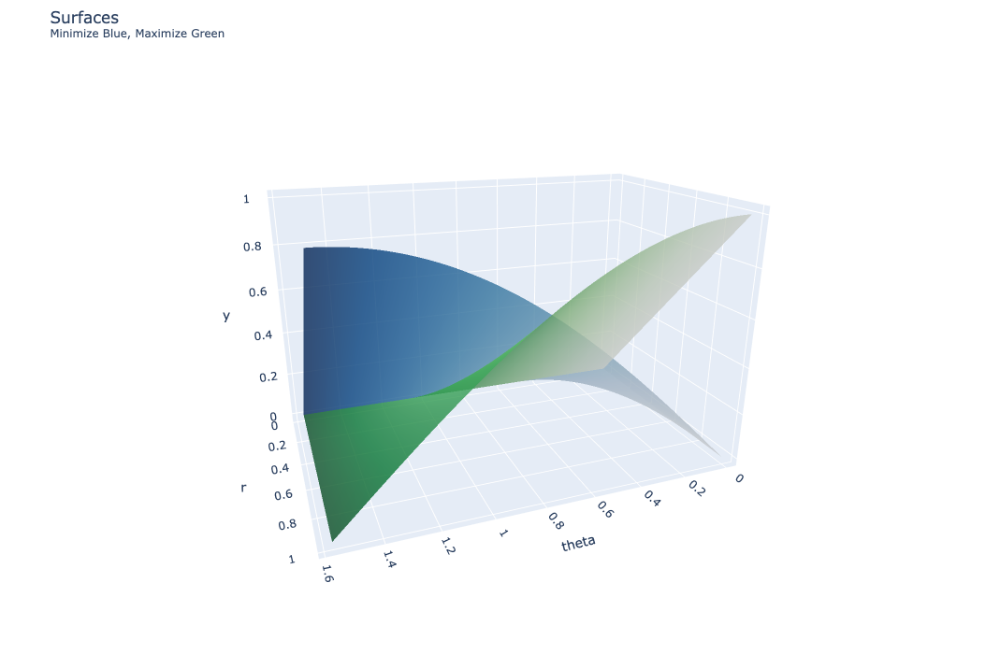

In [11]:
fig=go.Figure()
fig.add_trace(go.Surface(x=R, y=blue, z=THETA, showscale=False, opacity=0.8, colorscale='blues'))
fig.add_trace(go.Surface(x=R, y=green, z=THETA, showscale=False, opacity=0.8, colorscale='greens'))
fig.update_layout(
    title_text="Surfaces <br><sup>Minimize Blue, Maximize Green</sup>",
    scene =  dict(
        xaxis_title='r',
        yaxis_title='y',
        zaxis_title='theta'
    ),
    autosize=False,
    height=700,
    width=1200,
    margin=dict(r=10, l=10, b=50, t=50),
    scene_camera = dict(
        up=dict(x=0, y=1, z=0), # change from z=1 to y=1
        center=dict(x=0, y=0, z=0),
        eye=dict(x=2, y=.75, z=0.75) # default is 1.25 for all
    )
)

## Study
Define the `study_spec` and provide it to the Vizier client.  The `study_spec` contains the parameters, their value types and ranges, and the metric(s) with goals.

[Parameter Specs](https://googleapis.dev/python/aiplatform/latest/aiplatform_v1/types.html#google.cloud.aiplatform_v1.types.StudySpec.ParameterSpec) can also be [conditional](https://googleapis.dev/python/aiplatform/latest/aiplatform_v1/types.html#google.cloud.aiplatform_v1.types.StudySpec.ParameterSpec.conditional_parameter_specs)!

In [12]:
def make_study(algo, name_suffix):
    study_spec = {
        "display_name" : f"Study_{NOTEBOOK}_{name_suffix}",
        "study_spec" : {
            "algorithm" : algo,
            "parameters" : [
                {
                    "parameter_id" : "r",
                    "double_value_spec" : {
                        "min_value" : np.min(r),
                        "max_value" : np.max(r)
                    }
                },
                {
                    "parameter_id" : "theta",
                    "double_value_spec" : {
                        "min_value" : np.min(theta),
                        "max_value" : np.max(theta)
                    }

                }
            ],
            "metrics" : [
                {
                    "metric_id" : "blue",
                    "goal" : "MINIMIZE"
                },
                {
                    "metric_id" : "green",
                    "goal" : "MAXIMIZE" 
                }
            ]
        }
    }
    study = vizier.create_study(parent=PARENT, study=study_spec)
    return study

In [13]:
study_random = make_study("RANDOM_SEARCH", "Random")

In [14]:
study_random.name, study_random.display_name

('projects/764015827198/locations/us-central1/studies/2510583612472',
 'Study_06_Random')

## Evaluations
Create a function that evaluates the metric for given parameter inputs

In [15]:
def metrics(trial, r, theta):
    blue = r*np.sin(theta)
    green = r*np.cos(theta)
    m1 = {"metric_id" : "blue", "value" : blue}
    m2 = {"metric_id" : "green", "value" : green}
    return [m1, m2]

## Trials
Use a Python function to orchestrate a trial:
- for the `max_trials` continue iterating until the desired number has been reached
- From the Vizier trial, request sets (5) of parameter suggestion
    - Evaluate the metrics for the returned parameter suggestions
    - Add the metrics back to Vizier as trail results
- Repeat

In [16]:
def trial_runner(tname, max_trials):
    trial_id = 0
    while int(trial_id) < max_trials:
        suggestions = vizier.suggest_trials(
            {
                "parent": tname,
                "suggestion_count" : 5,
                "client_id" : "client1"
            }
        )

        for suggestion in suggestions.result().trials:
            trial_id = suggestion.name.split("/")[-1]
            trial = vizier.get_trial({"name" : suggestion.name})

            if trial.state in ["COMPLETED", "INFEASIBLE"]:
                continue

            for param in trial.parameters:
                if param.parameter_id == "r": 
                    r = param.value
                elif param.parameter_id == "theta":
                    theta = param.value

            vizier.add_trial_measurement(
                {
                    "trial_name": suggestion.name,
                    "measurement": {
                        "metrics": metrics(suggestion.name, r, theta)
                    }               
                }
            )

            response = vizier.complete_trial(
                {
                    "name" : suggestion.name,
                    "trial_infeasible": False
                }
            )

In [17]:
trial_runner(study_random.name, 100)

## Answers
Retrieve the trial results for all terations and plot

In [18]:
def plot_result(study):
    fig=go.Figure()
    fig.add_trace(go.Surface(x=R, y=blue, z=THETA, showscale=False, opacity=0.8, colorscale='blues'))
    fig.add_trace(go.Surface(x=R, y=green, z=THETA, showscale=False, opacity=0.8, colorscale='greens'))

    trials = vizier.list_trials({"parent": study.name})
    try_r = [x.parameters[0].value for x in trials.trials]
    try_theta = [x.parameters[1].value for x in trials.trials]
    try_blue = [x.measurements[0].metrics[0].value for x in trials.trials]
    try_green = [x.measurements[0].metrics[1].value for x in trials.trials]
    for i, j, k, h in zip(try_r, try_theta, try_blue, try_green):
        fig.add_trace(go.Scatter3d(x=[i,i], y=[k,h], z=[j,j], mode='lines+markers', line=dict(color="#ff0000"), marker=dict(size=5)))

    fig.update_layout(
        title_text="Surfaces <br><sup>Minimize Blue, Maximize Green</sup>",
        showlegend=False,
        scene =  dict(
            xaxis_title='r',
            yaxis_title='y',
            zaxis_title='theta'
        ),
        autosize=False,
        height=700,
        width=1200,
        margin=dict(r=10, l=10, b=50, t=50),
        scene_camera = dict(
            up=dict(x=0, y=1, z=0), # change from z=1 to y=1
            center=dict(x=0, y=0, z=0),
            eye=dict(x=2, y=.75, z=0.75) # default is 1.25 for all
        )
    )
    fig.show()

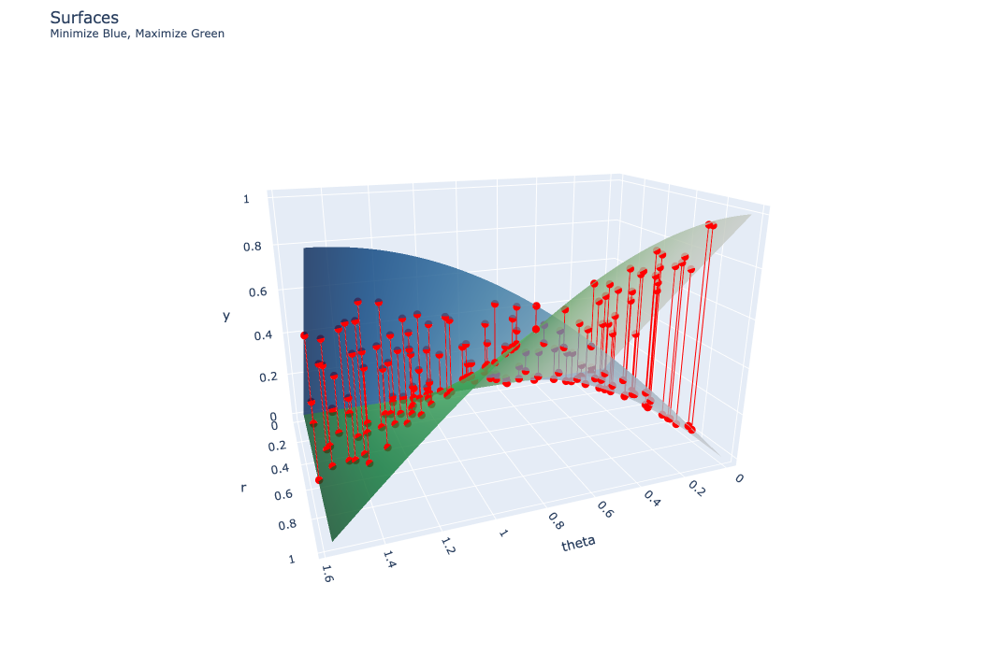

In [19]:
plot_result(study_random)

Optimal answer (so far ....):

In [20]:
def optimals(study):
    otrials = vizier.list_optimal_trials({"parent": study.name})
    print("r = {}".format(otrials.optimal_trials[-1].parameters[0].value))
    print("theta = {}".format(otrials.optimal_trials[-1].parameters[1].value))
    print("blue = {}".format(otrials.optimal_trials[-1].measurements[0].metrics[0].value))
    print("green = {}".format(otrials.optimal_trials[-1].measurements[0].metrics[1].value))
    print("Trial ID = {}".format(otrials.optimal_trials[-1].name.split("/")[-1]))

In [21]:
optimals(study_random)

r = 0.8257210921646264
theta = 0.14564713086021844
blue = 0.1198391639365434
green = 0.8169785167509203
Trial ID = 86


## Vizier Algorithm
Use the functions defined above to request a new study that uses the default method in Vizier = Bayesian Optimization.

In [22]:
study_viz = make_study("ALGORITHM_UNSPECIFIED", "Bayesian_Optimization") # unspecified means use the default = Vizier

In [23]:
trial_runner(study_viz.name, 100)

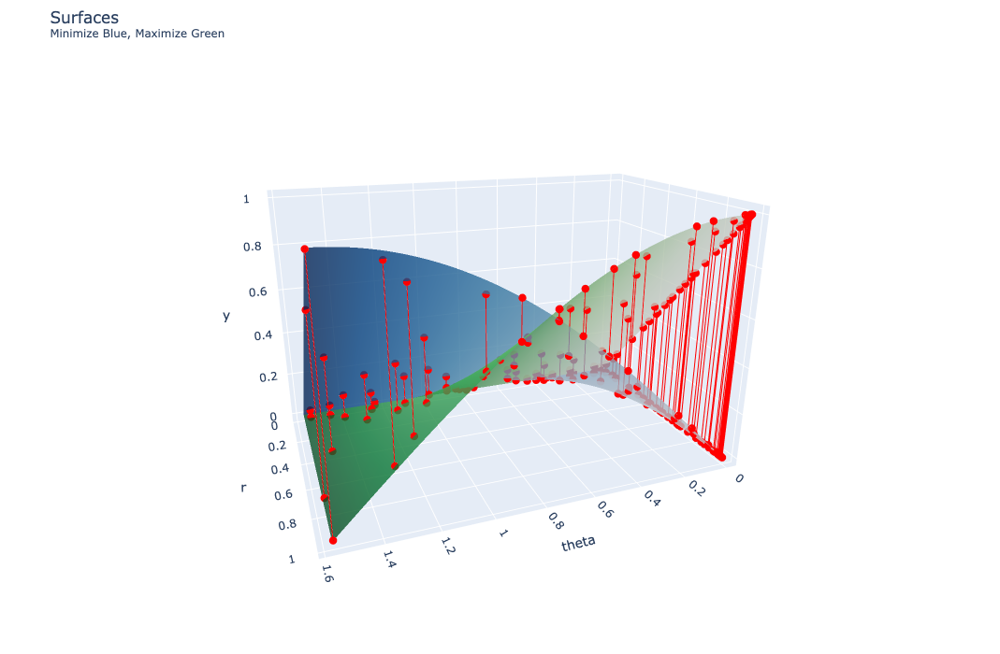

In [24]:
plot_result(study_viz)

In [25]:
optimals(study_viz)

r = 1.0
theta = 0.0
blue = 0.0
green = 1.0
Trial ID = 25


---
## Remove Resources
see notebook "99 - Cleanup"